<a href="https://colab.research.google.com/github/aydawudu/IAX/blob/main/Local_Model_agnostic_Interpretation_Methods_5.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Chocolate Rating Classification

## Data Prep

In [1]:
!pip install -r req5.txt

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 293.3/293.3 kB 4.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.0/3.0 MB 11.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 45.0/45.0 kB 4.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 547.9/547.9 kB 16.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 18.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283835 sha256=5a8966322d7a9c986efedc62fa44e464b0525b08949e00e48752742a04a97dc9
  Stored in directory: /root/.cache/pip/wheels/fd/a2/af/9ac0a1a85a27f314a06b39e1f492bee1547d52549a4606ed89
Successfully built lime
  Attempting uninstall: lightgbm
    Found existing installation: lightgbm 4.1.0
    Uninstalling lightgbm-4.1.0:
      Successfully uninstalled lightgbm-4.1.0
  Attempting uninstall: seaborn
    Found existing installation: seaborn 0.13.1
    Uninstalling seaborn-0.13.1:

In [2]:
import math
import re
import machine_learning_datasets as mldatasets
import pandas as pd
import numpy as np
import nltk
from nltk.probability import FreqDist
from nltk.tokenize import word_tokenize
from sklearn.model_selection import train_test_split
from sklearn.pipeline import make_pipeline
from sklearn import metrics, svm
from sklearn.feature_extraction.text import TfidfVectorizer
import lightgbm as lgb
import matplotlib.pyplot as plt
import seaborn as sns
import shap
import lime
import lime.lime_tabular
from lime.lime_text import LimeTextExplainer

In [3]:
chocolateratings_df=mldatasets.load("chocolate-bar-ratings_v2")

https://github.com/PacktPublishing/Interpretable-Machine-Learning-with-Python/raw/master/datasets/chocolate-ratings_v2.zip downloaded to /content/data/chocolate-ratings_v2.zip
/content/data/chocolate-ratings_v2.zip uncompressed to /content/data/chocolate-ratings_v2
1 dataset files found in /content/data/chocolate-ratings_v2 folder
parsing /content/data/chocolate-ratings_v2/chocolate_v2.csv


In [4]:
chocolateratings_df

,company,company_location,review_date,country_of_bean_origin,cocoa_percent,rating,counts_of_ingredients,cocoa_butter,vanilla,lecithin,salt,sugar,sweetener_without_sugar,first_taste,second_taste,third_taste,fourth_taste
0,5150,U.S.A,2019,Madagascar,76.0,3.75,3,1,0,0,0,1,0,cocoa,blackberry,robust,NaN
1,5150,U.S.A,2019,Dominican republic,76.0,3.50,3,1,0,0,0,1,0,cocoa,vegetal,savory,NaN
2,5150,U.S.A,2019,Tanzania,76.0,3.25,3,1,0,0,0,1,0,rich,fatty,bready,NaN
3,A. Morin,France,2012,Peru,63.0,3.75,4,1,0,1,0,1,0,fruity,melon,roasty,NaN
4,A. Morin,France,2012,Bolivia,70.0,3.50,4,1,0,1,0,1,0,vegetal,nutty,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2219,Zotter,Austria,2014,Blend,80.0,2.75,4,1,0,0,1,0,1,waxy,cloying,vegetal,NaN
2220,Zotter,Austria,2017,Colombia,75.0,3.75,3,1,0,0,0,1,0,strong nutty,marshmallow,NaN,NaN
2221,Zotter,Austria,2018,Belize,72.0,3.50,3,1,0,0,0,1,0,muted,roasty,accessible,NaN
2222,Zotter,Austria,2018,Congo,70.0,3.25,3,1,0,0,0,1,0,fatty,mild nuts,mild fruit,NaN


In [5]:
#create df for taste features
tastes_df=chocolateratings_df[['first_taste', 'second_taste', 'third_taste', 'fourth_taste']]
chocolateratings_df=chocolateratings_df.drop(['first_taste', 'second_taste', 'third_taste', 'fourth_taste'], axis=1)

In [6]:
tastes_df.head(90).tail(10)

,first_taste,second_taste,third_taste,fourth_taste
80,oily,vegetal,nutty,cocoa
81,oily,vanilla,melon,cocoa
82,rich,sour,mild smoke,NaN
83,fruity,sour,NaN,NaN
84,roast,high astringent,NaN,NaN
85,smokey,savory,NaN,NaN
86,sandy,roasty,nutty,NaN
87,roasty,brownie,nutty,NaN
88,red wine,rich,long,NaN
89,creamy,fruit,cocoa,NaN


In [7]:
#categorically encode the categorical features and establish a threshold
chocolateratings_df=mldatasets.make_dummies_with_limits(chocolateratings_df,
                                                        'company_location', 0.03333)
chocolateratings_df=mldatasets.make_dummies_with_limits(chocolateratings_df,
                                                        'country_of_bean_origin', 0.03333)

In [8]:
#process tastes df, replace nulls with empty string then join all columns to remove whitespace
tastes_s=tastes_df.replace(np.nan, '', regex=True).agg(' '.join, axis=1).str.strip()

In [9]:
print(tastes_s)

0          cocoa blackberry robust
1             cocoa vegetal savory
2                rich fatty bready
3              fruity melon roasty
4                    vegetal nutty
                   ...            
2219          waxy cloying vegetal
2220      strong nutty marshmallow
2221       muted roasty accessible
2222    fatty mild nuts mild fruit
2223            fatty earthy cocoa
Length: 2224, dtype: object


In [10]:
#print unique phrases
print(np.unique(tastes_s).shape)

(2178,)


In [11]:
#get the most common words (frequency distribution)
nltk.download('punkt')
tastewords_fdist=FreqDist(word for word in word_tokenize(tastes_s.str.cat(sep=' ')))
tastewords_df=pd.DataFrame.from_dict(tastewords_fdist,
                                     orient='index').rename(columns={0:'freq'})


[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


In [12]:
tastewords_df

,freq
cocoa,257
blackberry,10
robust,6
vegetal,35
savory,15
...,...
noticeable,1
prune,1
masculine,1
cadbury,1


In [13]:
 #save those words  with more than 74 instances
commontastes_l=tastewords_df[tastewords_df.freq > 74].index.to_list()
print(commontastes_l)

['cocoa', 'rich', 'fatty', 'roasty', 'nutty', 'sweet', 'sandy', 'sour', 'intense', 'mild', 'fruit', 'sticky', 'earthy', 'spice', 'molasses', 'floral', 'spicy', 'woody', 'coffee', 'berry', 'vanilla', 'creamy']


In [14]:
#turn the most common words into dummies in out dataset
chocolateratings_df['tastes']=tastes_s #to add the transform taste column back
chocolateratings_df=mldatasets.make_dummies_from_dict(chocolateratings_df, 'tastes', commontastes_l)

In [15]:
chocolateratings_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2224 entries, 0 to 2223
Data columns (total 46 columns):
 #   Column                                     Non-Null Count  Dtype  
---  ------                                     --------------  -----  
 0   company                                    2224 non-null   object 
 1   review_date                                2224 non-null   int64  
 2   cocoa_percent                              2224 non-null   float64
 3   rating                                     2224 non-null   float64
 4   counts_of_ingredients                      2224 non-null   int64  
 5   cocoa_butter                               2224 non-null   int64  
 6   vanilla                                    2224 non-null   int64  
 7   lecithin                                   2224 non-null   int64  
 8   salt                                       2224 non-null   int64  
 9   sugar                                      2224 non-null   int64  
 10  sweetener_without_sugar 

In [16]:
#split data
rand=9
y=chocolateratings_df['rating'].apply(lambda x : 1 if x > 3.5 else 0)
X=chocolateratings_df.drop(['rating','company'], axis=1).copy()
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33,
                                                    random_state=rand)

In [17]:
#split nlp dataset
X_train_nlp=tastes_s[X_train.index]
X_test_nlp=tastes_s[X_test.index]

## Leveraging SHAP’s KernelExplainer for Local Interpretations with SHAP Values
### Train C-Support Vector Classification Model

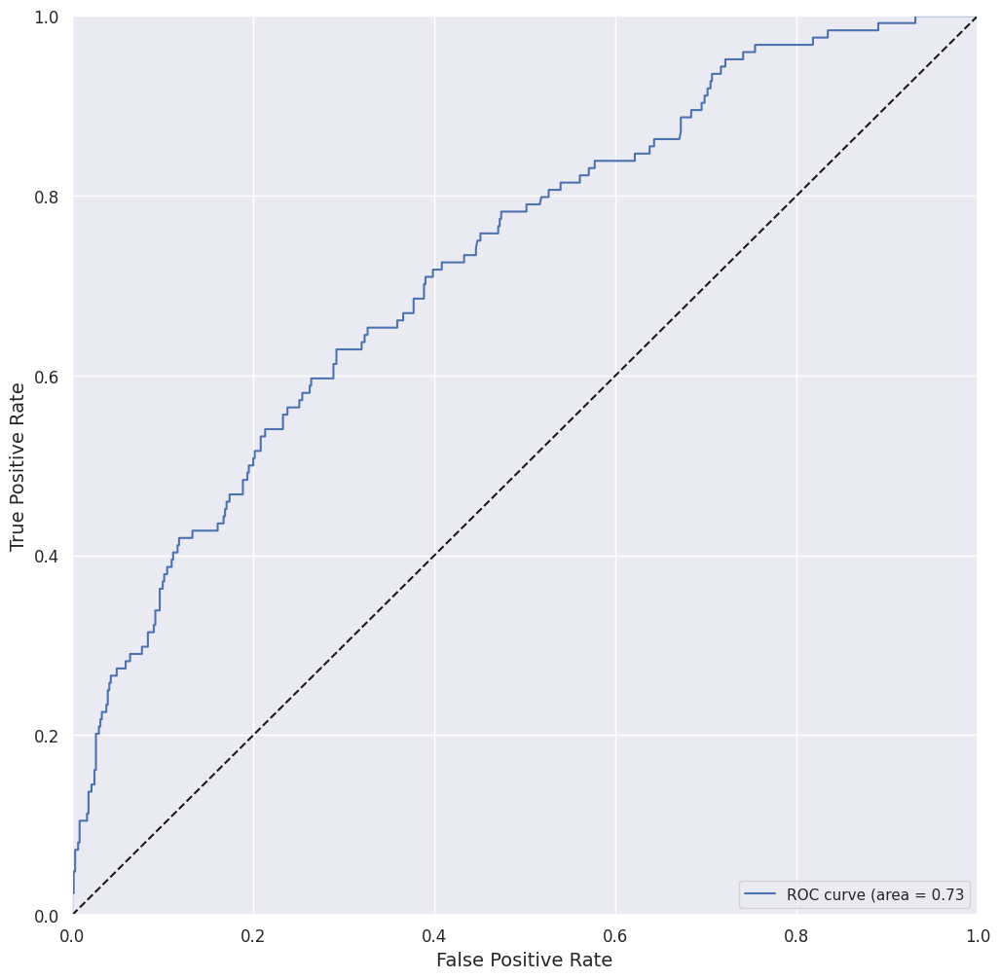

Accuracy_train:  0.8376		Accuracy_test:   0.8365
Precision_test:  0.7500		Recall_test:     0.0484
ROC-AUC_test:    0.7263		F1_test:         0.0909		MCC_test: 0.1628


In [18]:
orig_plt_params=plt.rcParams #saving the original matplotlib settings
sns.set()
svm_mdl=svm.SVC(probability=True, gamma='auto', random_state=rand)
fitted_svm_mdl=svm_mdl.fit(X_train, y_train)
y_train_svc_pred, y_test_svc_prob, y_test_svc_pred=mldatasets.evaluate_class_mdl(
                                                  fitted_svm_mdl, X_train, X_test,
                                                  y_train, y_test)


Not bad, AUC is above the dotten line, Mattews correlation coefficient is above 0 and precision is higher is than recall which is good since we prefer fewer false positives thsn false negatives

## Computing SHAP Values using KernelExplainer

In [19]:
#the index needs to be in order since the KernelExplainer yields a list of multiple SHAP values
print(svm_mdl.classes_)

[0 1]


0= not higly recommended
1 = highly recommended

we will be focusing on the SHAP Values of the *Highly Recommended*

In [20]:
np.random.seed(rand)
X_train_summary = shap.kmeans(X_train, 10)  #to summarice background training data to minize computation
shap_svm_explainer=shap.KernelExplainer(fitted_svm_mdl.predict_proba, X_train_summary)
shap_svm_values_test=shap_svm_explainer.shap_values(X_test, nsamples=200,
                                                    l1_reg="num_features(20)") #to regulalize to a point where it have only 20 relevant features

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning


  0%|          | 0/734 [00:00<?, ?it/s]

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


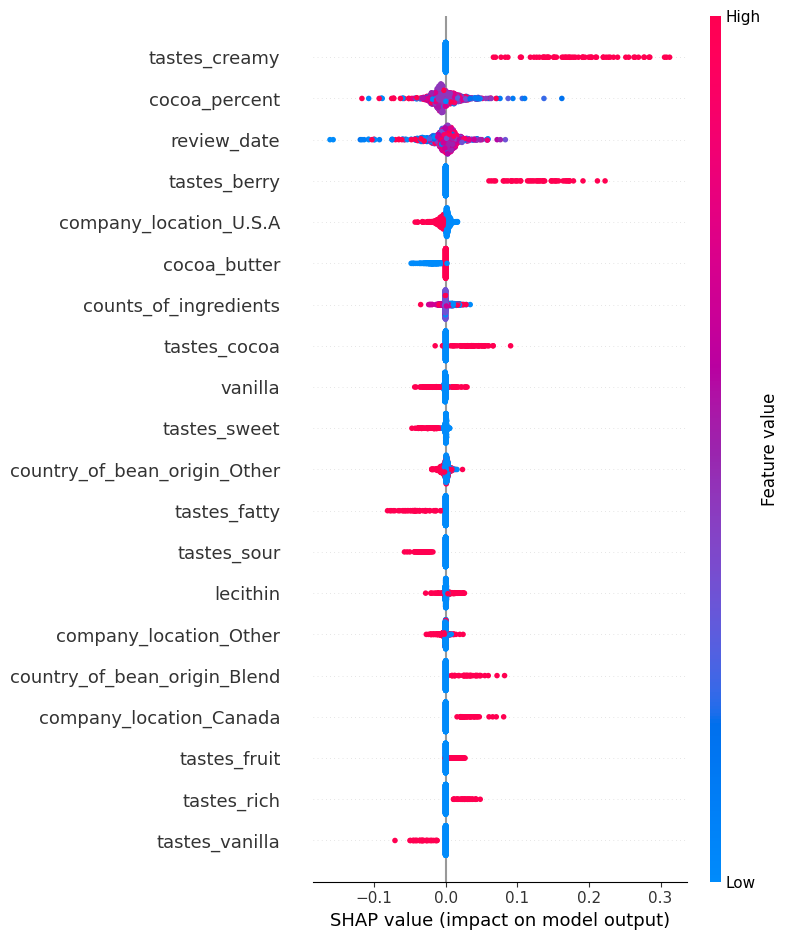

In [21]:
#let's visualize
sns.reset_orig()
plt.rcParams.update(orig_plt_params)
shap.summary_plot(shap_svm_values_test[1], X_test, plot_type="dot")

### Local Interpretation for a group of predictions using Decision Plots

In [22]:
#select a sample
sample_test_idx=X_test.index.get_indexer_for([5,6,7,18,19,21,24,25,27])

In [23]:
expected_value = shap_svm_explainer.expected_value[1]
y_test_shap_pred = (shap_svm_values_test[1].sum(1) + expected_value) > 0.5
print(np.array_equal(y_test_shap_pred, y_test_svc_pred))

True


In [24]:
#figure out which one of our samples are negatives
FN = (~y_test_shap_pred[sample_test_idx]) &\
     (y_test.iloc[sample_test_idx] == 1).to_numpy()

In [25]:
FN

array([ True,  True,  True, False, False, False, False,  True, False])

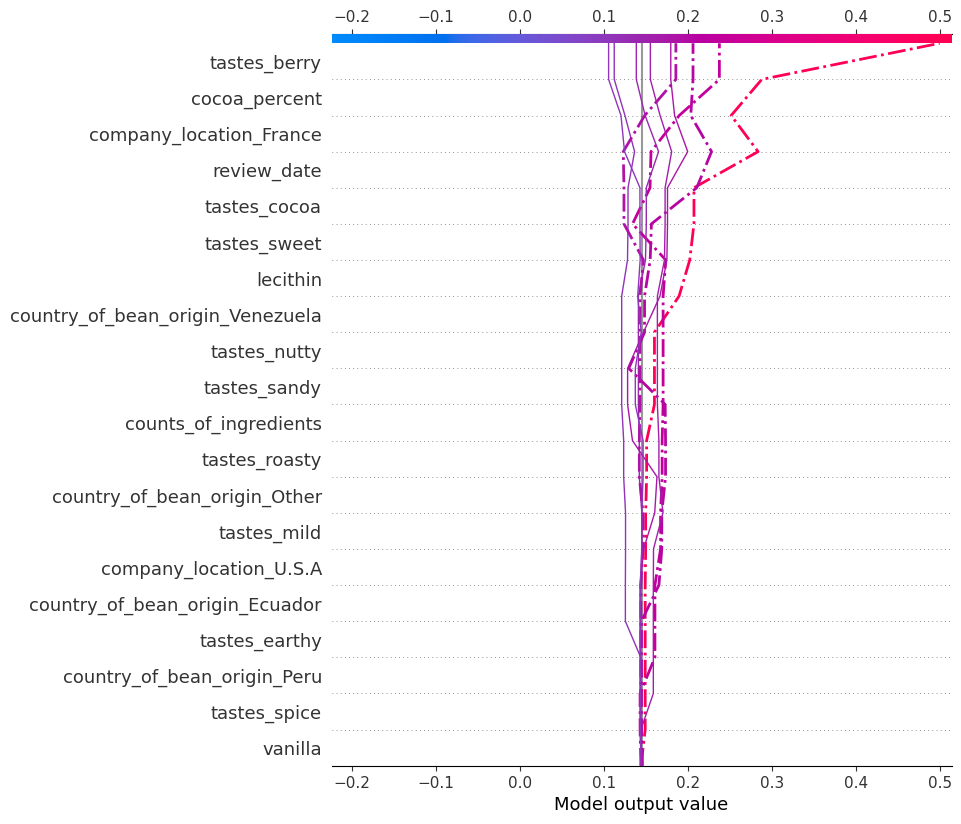

In [26]:
#plot a decision boundry between the expected values, the SHAP values, and the actual values
#highlightinh false negative
shap.decision_plot(expected_value, shap_svm_values_test[1][sample_test_idx],\
                   X_test.iloc[sample_test_idx], highlight=FN)

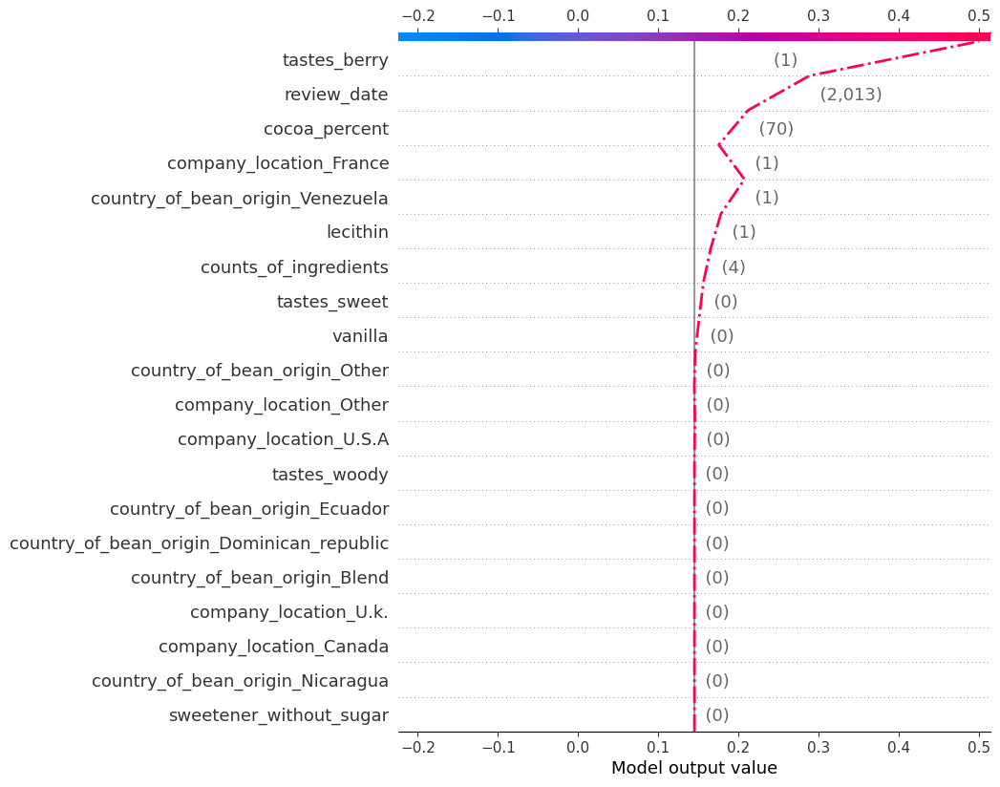

In [27]:
#let's isolate a single observation
shap.decision_plot(expected_value, shap_svm_values_test[1][696], X_test.iloc[696], highlight=0)

### Local Interpretation for a single prediction at a time using Force Plot

In [28]:
#compare single predictions side by side
pd.set_option('display.precision', 0)
eval_idxs = X_test.index.isin([5,24])
X_test_eval = X_test[eval_idxs]
eval_compare_df = pd.concat([\
            chocolateratings_df.iloc[X_test[eval_idxs].index].rating,\
            pd.DataFrame({'y':y_test[eval_idxs]}, index=[5,24]),\
            pd.DataFrame({'y_pred':y_test_svc_pred[eval_idxs]},\
                         index=[24,5]),
            X_test_eval], axis=1).transpose()
eval_compare_df

,24,5
rating,3,4
y,0,1
y_pred,0,0
review_date,2015,2013
cocoa_percent,70,70
counts_of_ingredients,4,4
cocoa_butter,1,1
vanilla,0,0
lecithin,1,1
salt,0,0


In [29]:
#let use force plot to see complete story
shap.initjs()
shap.force_plot(expected_value, shap_svm_values_test[1][X_test.index==5],
                X_test[X_test.index==5])

In [30]:
shap.initjs()
shap.force_plot(expected_value, shap_svm_values_test[1][X_test.index==24],
                X_test[X_test.index==24])

## Employing Local Interpretable Model-agnostic Explanations (LIME)

### Local Interpretation for a single prediction at a time using LimeTabularExplainer

In [34]:
#try out lime for instance 24 and 5
lime_svm_explainer = lime.lime_tabular.LimeTabularExplainer(
    X_test.values,  # requires numpy 2D array
    feature_names=X_test.columns,  # requires a list of feature names
    categorical_features=list(range(3, 44)),  # telling LIME which features are categorical is important
    class_names=['Not Highly Recomm.', 'Highly Recomm.']
)


In [38]:
#use the explainer to fit a local surrogate model to observation #5

lime_svm_explainer.explain_instance(X_test[X_test.index==5].values[0],
                                    fitted_svm_mdl.predict_proba,
                                    num_features=8).show_in_notebook(predict_proba=True)

X does not have valid feature names, but SVC was fitted with feature names


In [39]:
#use the explainer to fit a local surrogate model to observation #24
lime_svm_explainer.explain_instance(X_test[X_test.index==24].values[0],
                                    fitted_svm_mdl.predict_proba,
                                    num_features=8).show_in_notebook(predict_proba=True)

X does not have valid feature names, but SVC was fitted with feature names


### Using LIME for Natural Language Processing


In [31]:
print(X_test_nlp)

1194                 roasty nutty rich
77      roasty oddly sweet marshmallow
121              balanced cherry choco
411                sweet floral yogurt
1259           creamy burnt nuts woody
                     ...              
327          sweet mild molasses bland
1832          intense fruity mild sour
464              roasty sour milk note
2013           nutty fruit sour floral
1190           rich roasty nutty smoke
Length: 734, dtype: object


In [40]:
#using TFID vectorizer to get how freqent a term occurs
vectorizer=TfidfVectorizer(lowercase=False)
X_train_nlp_fit=vectorizer.fit_transform(X_train_nlp)
X_test_nlp_fit=vectorizer.transform(X_test_nlp)

In [47]:
#display the TF-IDF Score
pd.set_option('display.precision', 6)
pd.DataFrame({'taste':vectorizer.get_feature_names_out(),
              'tf-idf':np.asarray(X_test_nlp_fit[X_test_nlp.index==5].todense())[0]}).\
              sort_values(by='tf-idf', ascending=False).head(10)

,taste,tf-idf
305,raspberry,0.585538
259,nut,0.491542
265,oily,0.463973
64,caramel,0.447504
274,papaya,0.000000
283,perfume,0.000000
282,perfect,0.000000
281,pepper,0.000000
280,pear,0.000000
279,peanutbutter,0.000000


### Train LightGBM Model

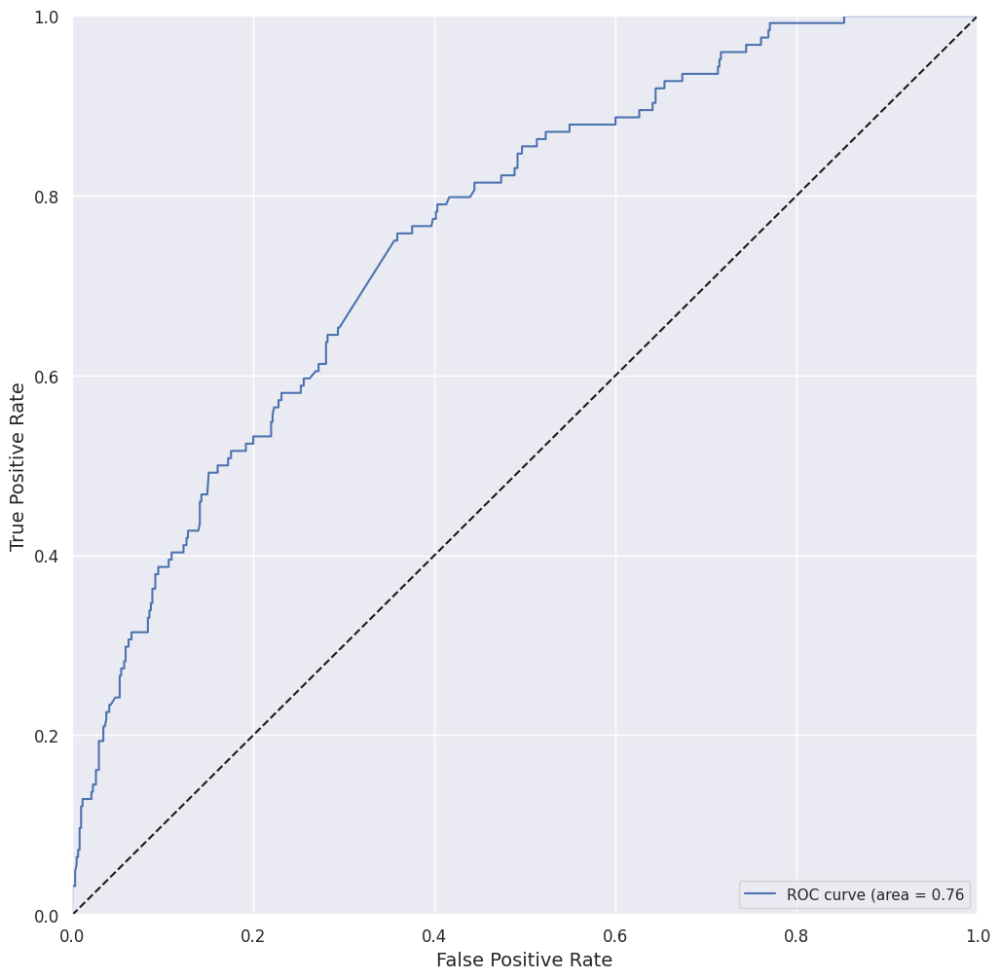

Accuracy_train:  0.8812		Accuracy_test:   0.8392
Precision_test:  0.5714		Recall_test:     0.1935
ROC-AUC_test:    0.7581		F1_test:         0.2892		MCC_test: 0.2646


In [52]:
sns.set()
lgb_mdl=lgb.LGBMClassifier(max_depth=13, learning_rate=0.05, n_estimators=100,
                           objective='binary', verbose=-1, force_row_wise=True,
                           random_state=rand)
fitted_lgb_mdl=lgb_mdl.fit(X_train_nlp_fit, y_train)
y_train_lgb_pred, y_test_lgb_prob, y_test_lgb_pred= mldatasets.evaluate_class_mdl(
    fitted_lgb_mdl, X_train_nlp_fit, X_test_nlp_fit, y_train, y_test
)

### Local Interpretation for a single prediction at a time using LimeTextExplainer

In [53]:
#use the make_pipeline functions to to vectorize our text
lgb_pipeline=make_pipeline(vectorizer, lgb_mdl)
#initialize the LimeTextExplainer
lime_lgb_explainer=LimeTextExplainer(
    class_names = ['Not Highly Recomm.', 'Highly Recomm.']
)

In [54]:
#explaining an instance 5
lime_lgb_explainer.explain_instance(X_test_nlp[X_test_nlp.index==5].values[0],
                                    lgb_pipeline.predict_proba, num_features=4).\
                                    show_in_notebook(text=True)

In [55]:
#explaining an instance 24
lime_lgb_explainer.explain_instance(X_test_nlp[X_test_nlp.index==24].values[0],
                                    lgb_pipeline.predict_proba, num_features=4).\
                                    show_in_notebook(text=True)

In [56]:
#using text to explore our pipeline that can vectorize any arbitrary text
#trying adjectives we think the model will favors
lime_lgb_explainer.explain_instance('creamy rich complex fruity',
                                    lgb_pipeline.predict_proba, num_features=4).\
                                    show_in_notebook(text=True)

In [57]:
#trying adjectives we think the model will not favors
lime_lgb_explainer.explain_instance('sour bitter roasty molasses',
                                    lgb_pipeline.predict_proba, num_features=4).\
                                    show_in_notebook(text=True)

In [58]:
#trying adjectives that the model shouldn't understand
lime_lgb_explainer.explain_instance('nasty disgusting gross stuff',
                                    lgb_pipeline.predict_proba, num_features=4).\
                                    show_in_notebook(text=True)

The model guessed on the third one since the model has not seen the words before. The guess is based on the majority class "not higly recommended"

### Trying SHAP for Natural Language Processing

- Not recommended for NLP because it;s slow, has high computation cost
- it requires a single set of prediction

In [60]:
predict_fn= lambda X: lgb_mdl.predict_proba(X)[:, 1]

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning


  0%|          | 0/100 [00:00<?, ?it/s]

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


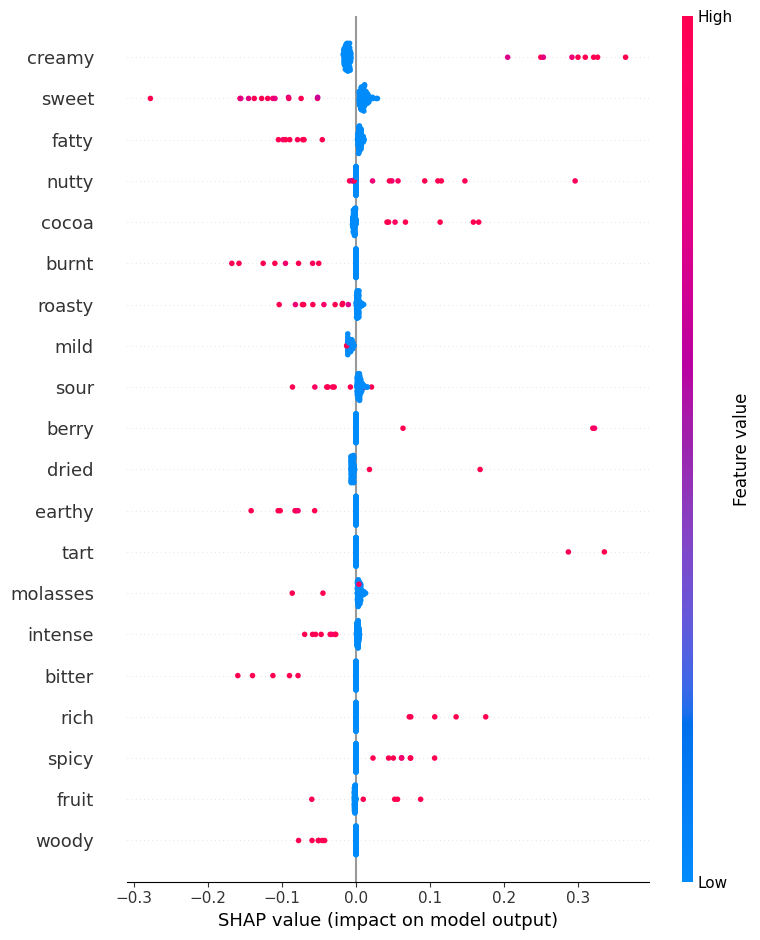

In [63]:
sns.reset_orig()
plt.rcParams.update(orig_plt_params)
X_test_nlp_samp_df = pd.DataFrame(X_test_nlp_fit[:100].todense()) #SHAP is incompatible with SciPy's sparse matrices
shap_lgb_explainer = shap.KernelExplainer(predict_fn,\
                            shap.kmeans(X_train_nlp_fit.toarray(), 10))
shap_lgb_values_test = shap_lgb_explainer.shap_values(X_test_nlp_samp_df,\
                                            l1_reg="num_features(20)")
shap.summary_plot(shap_lgb_values_test, X_test_nlp_samp_df,\
            plot_type="dot", feature_names=vectorizer.get_feature_names_out())

In [64]:
#using shap for local intepretation, 18th obsevation
print(shap.sample(X_test_nlp, 50).to_list()[18])

cocoa orange


In [66]:
#using index to find location to match the book example
pos=X_test_nlp.index.get_loc(1002)
print(X_test_nlp.to_list()[pos])

woody earthy medicinal


In [67]:
#local interpretation
shap.initjs()
shap.force_plot(shap_lgb_explainer.expected_value, shap_lgb_values_test[pos, :],
                X_test_nlp_samp_df.iloc[pos, :], feature_names=vectorizer.get_feature_names_out())

In [69]:
#trying another one
pos=X_test_nlp.index.get_loc(1583)
print(X_test_nlp.to_list()[pos])

intense spicy floral


In [70]:
#let visualize
shap.initjs()
shap.force_plot(shap_lgb_explainer.expected_value, shap_lgb_values_test[pos, :],
                X_test_nlp_samp_df.iloc[pos, :], feature_names=vectorizer.get_feature_names_out())